In [1]:
from pathlib import Path
from hloc.utils.io import list_h5_names, get_matches, get_keypoints
from hloc.visualization import plot_images, plot_keypoints, plot_matches, read_image, add_text, cm_RdGn
import numpy as np

In [2]:
DIR = "../data"
MODE = "train"
NAME = "aliked2k+disk+sift-rot-pixsfm-sci-loc"
dataset = "dioscuri"
scene = "dioscuri"

scene_dir = Path(f"../temp/{NAME}/{dataset}/{scene}")
images = Path(f"{DIR}/{MODE}/{dataset}/images")

ids = (6, 7)
rotate = (1, 0)

In [3]:
def plot_feature_matching(features, matches, ids, rotate=(0, 0)):
    image_names = sorted(list_h5_names(features))
    pairs = sorted(list_h5_names(matches))

    id0, id1 = ids

    name0 = image_names[id0]
    name1 = image_names[id1]

    plot_images([read_image(images / name0), read_image(images / name1)])

    kp0, kp1 = get_keypoints(features, name0), get_keypoints(features, name1)
    m, sc = get_matches(matches, name0, name1)

    plot_images([np.rot90(read_image(images / name0), k=rotate[0]), np.rot90(read_image(images / name1), k=rotate[1])])
    plot_matches(kp0[m[:,0]], kp1[m[:,1]], color="lime", a=0.1)

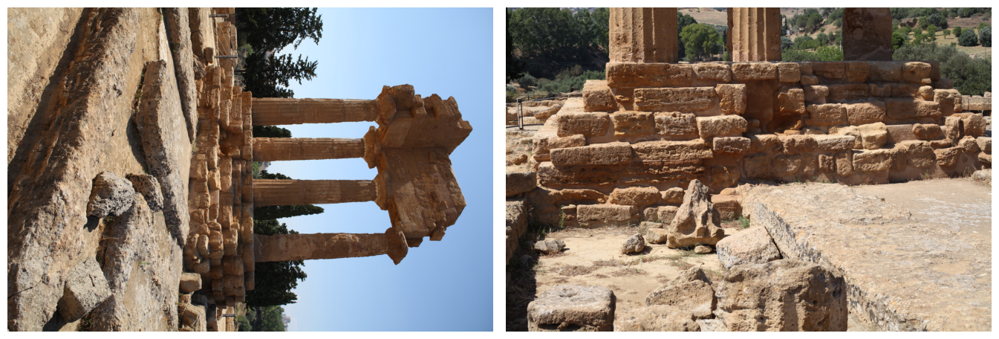

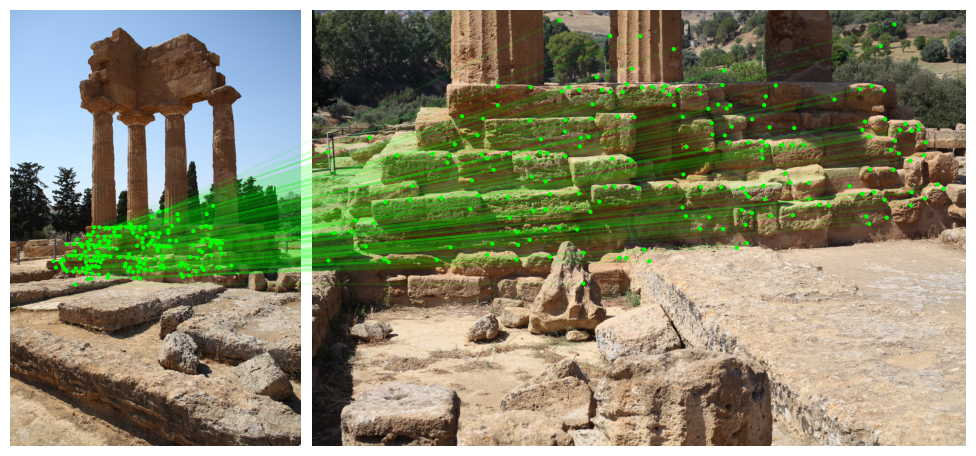

In [4]:
features = scene_dir / "feats-aliked2k.h5"
matches = scene_dir / "matches-aliked2k-lightglue.h5"
plot_feature_matching(features, matches, ids, rotate=rotate)


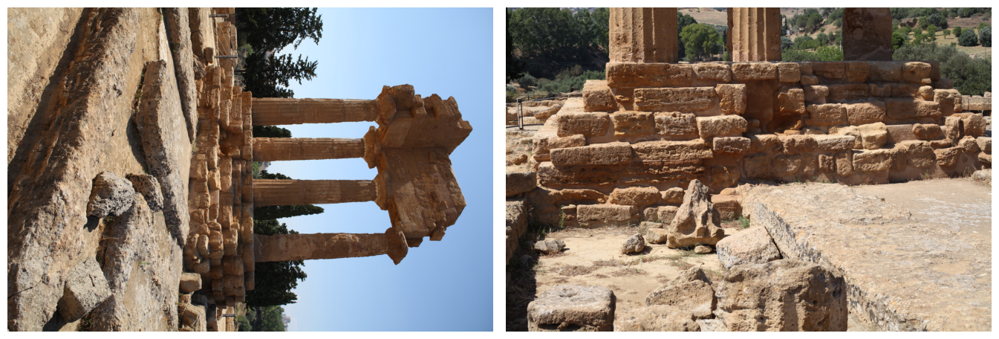

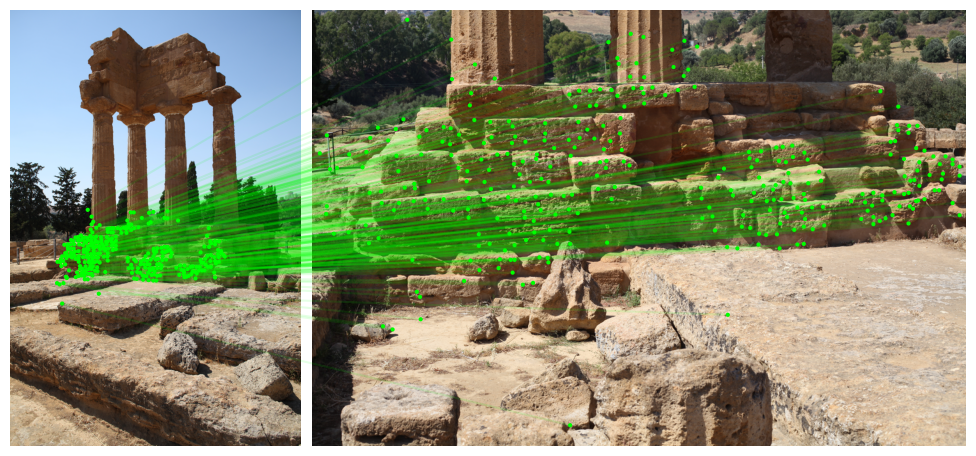

In [5]:
features = scene_dir / "feats-disk.h5"
matches = scene_dir / "matches-disk-lightglue.h5"
plot_feature_matching(features, matches, ids, rotate=rotate)

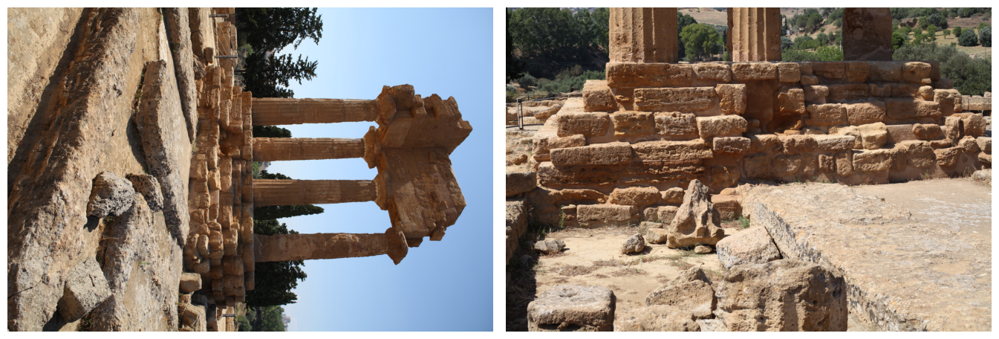

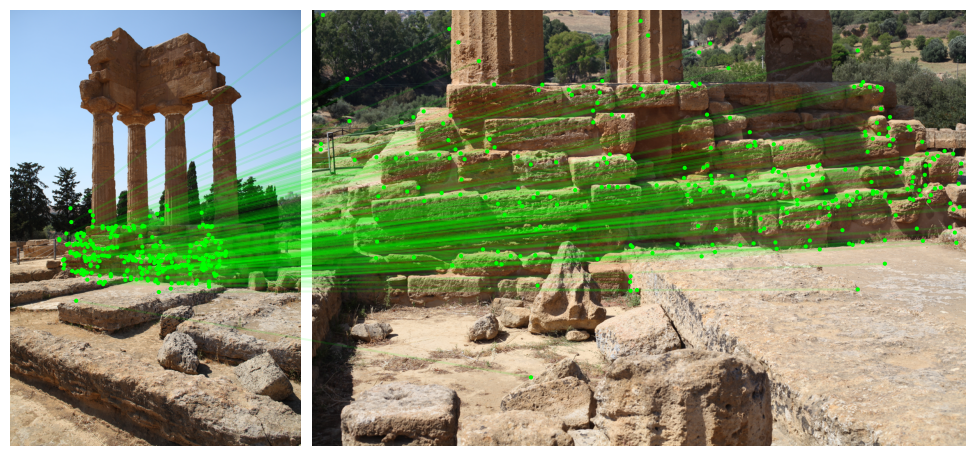

In [6]:
features = scene_dir / "feats-sift.h5"
matches = scene_dir / "matches-sift-lightglue.h5"
plot_feature_matching(features, matches, ids, rotate=rotate)

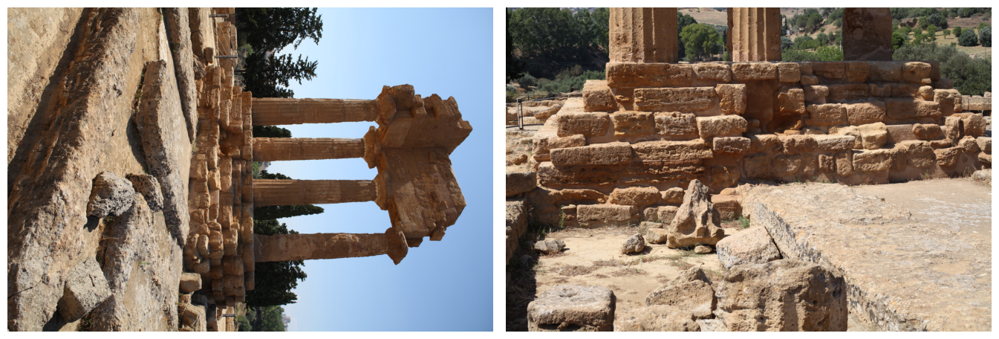

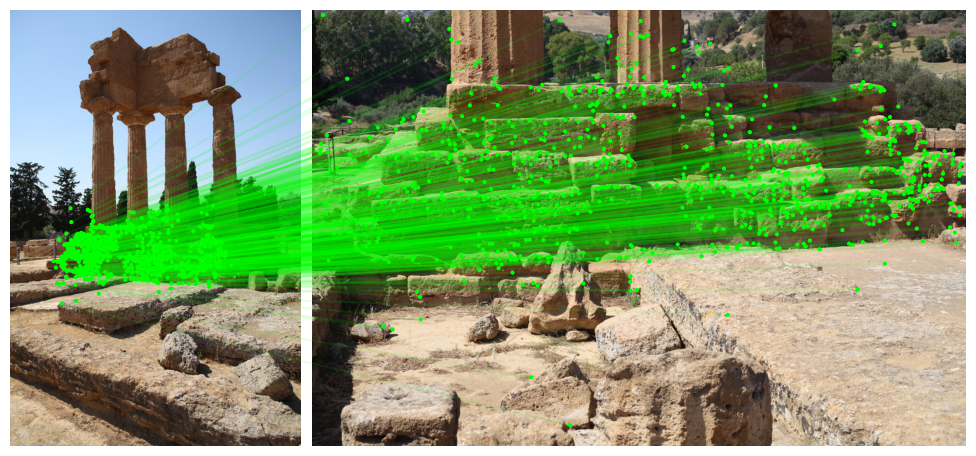

In [7]:
features = scene_dir / "features_rotated.h5"
matches = scene_dir / "matches.h5"
plot_feature_matching(features, matches, ids, rotate=rotate)

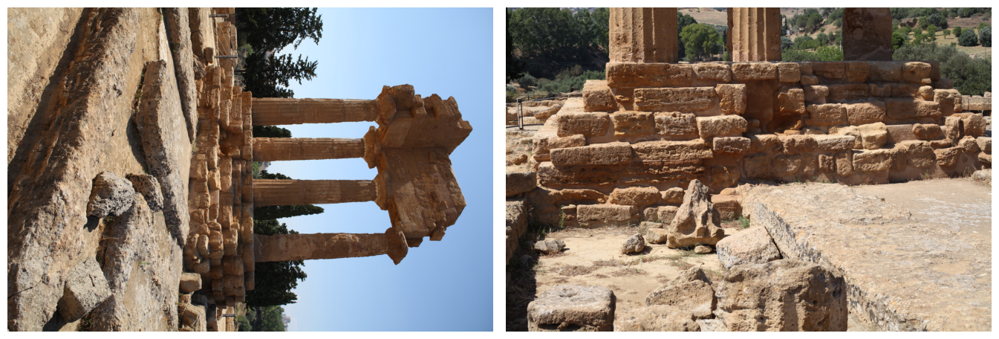

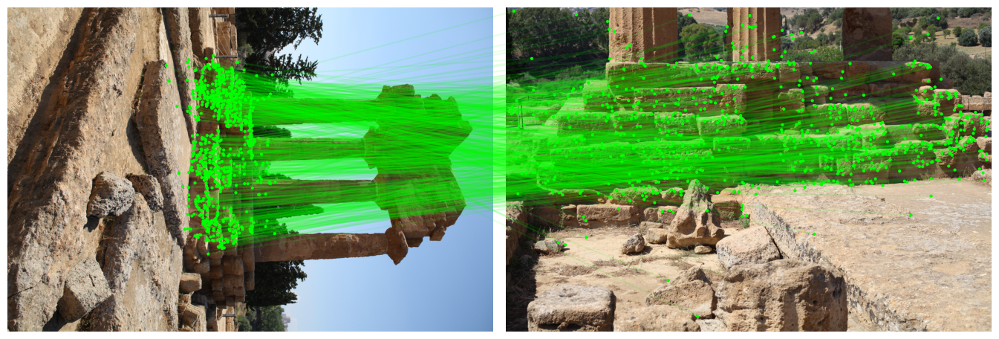

In [8]:
features = scene_dir / "features.h5"
matches = scene_dir / "matches.h5"
plot_feature_matching(features, matches, ids, rotate=(0, 0))